# Music emotion analysis 
#### A. Download DEAM dataset

In [1]:
import seaborn as sns
import kagglehub
import pandas as pd
import numpy as np
import os
from pathlib import Path
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio, display

In [2]:
import kagglehub
print("kagglehub is now accessible!")


# Download latest version
path = kagglehub.dataset_download("imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music")

print("Path to dataset files:", path)

kagglehub is now accessible!
Path to dataset files: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1


In [ ]:
# for root, dirs, files in os.walk(path):
#     print(f"Current Directory: {root}")
#     print(f"Subdirectories: {dirs}")
#     print(f"Files: {files}")
#     print("------")

Current Directory: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1
Subdirectories: ['DEAM_audio', 'DEAM_Annotations', 'features']
Files: ['.DS_Store']
------
Current Directory: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio
Subdirectories: ['MEMD_audio']
Files: []
------
Current Directory: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio/MEMD_audio
Subdirectories: []
Files: ['746.mp3', '1588.mp3', '1563.mp3', '1205.mp3', '791.mp3', '949.mp3', '1211.mp3', '1577.mp3', '2056.mp3', '1239.mp3', '961.mp3', '2042.mp3', '550.mp3', '236.mp3', '222.mp3', '544.mp3', '1946.mp3', '1952.mp3', '1007.mp3', '1761.mp3', '1775.mp3', '1013.mp3', '1985.mp3', '1749.mp3', '1991.mp3', '342.mp3', '356.mp3', '430.mp3', '1832.mp3', '1826.mp3', '1198.mp3', '1173.mp3', '381.mp3', '1615.mp3', 

In [4]:
audio_path = Path(os.path.join(path, 'DEAM_audio/MEMD_audio'))
static_annotations_path_1 = Path(os.path.join(path, "DEAM_annotations/annotations/annotations averaged per song/song_level/static_annotations_averaged_songs_1_2000.csv"))
static_annotations_path_2 = Path(os.path.join(path, "DEAM_annotations/annotations/annotations averaged per song/song_level/static_annotations_averaged_songs_2000_2058.csv"))

In [5]:
static_annotations_1 = pd.read_csv(static_annotations_path_1)
static_annotations_2 = pd.read_csv(static_annotations_path_2)


In [6]:
# choose needed valriables
static_annotations_2.columns.str.strip()
static_annotations_2 = static_annotations_2.loc[:,['song_id', ' valence_mean', ' valence_std', ' arousal_mean', ' arousal_std']]
static_annotations_2.rename(columns={'song_id':'song_id', ' valence_mean':'valence_mean', ' valence_std':'valence_std', ' arousal_mean':'arousal_mean', ' arousal_std':'arousal_std'}, inplace=True)


In [7]:
# choose need variables
static_annotations_1.rename(inplace=True,columns={'song_id':'song_id', ' valence_mean':'valence_mean', ' valence_std':'valence_std', ' arousal_mean':'arousal_mean', ' arousal_std':'arousal_std'})
static_annotations_1.head()

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
0,2,3.1,0.94,3.0,0.63
1,3,3.5,1.75,3.3,1.62
2,4,5.7,1.42,5.5,1.63
3,5,4.4,2.01,5.3,1.85
4,7,5.8,1.47,6.4,1.69


In [8]:
static_annotations = pd.concat([static_annotations_1, static_annotations_2], axis=0)
static_annotations.head()
static_annotations.tail(10)
static_annotations.reset_index(drop=True, inplace=True)

In [9]:
# create audio path
static_annotations['audio_path'] = static_annotations['song_id'].apply(lambda x: os.path.join(audio_path, f'{x}.mp3'))

In [10]:
def play_audio_with_visuals(file_path):
    print(f"Playing: {file_path}")
    y, sr = librosa.load(file_path, sr=None)  # Load the audio file
    
    # Plot waveform and spectrogram
    plt.figure(figsize=(12, 6))

    # Waveform plot
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Spectrogram plot with log scale
    plt.subplot(2, 1, 2)
    S = librosa.stft(y)  # Compute Short-Time Fourier Transform (STFT)
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)  # Convert amplitude to decibels
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log', cmap='magma')  # Log scale for frequency
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram (Log Scale)')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    plt.tight_layout()
    plt.show()

    # Play audio
    display(Audio(file_path))

Playing: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio/MEMD_audio/150.mp3


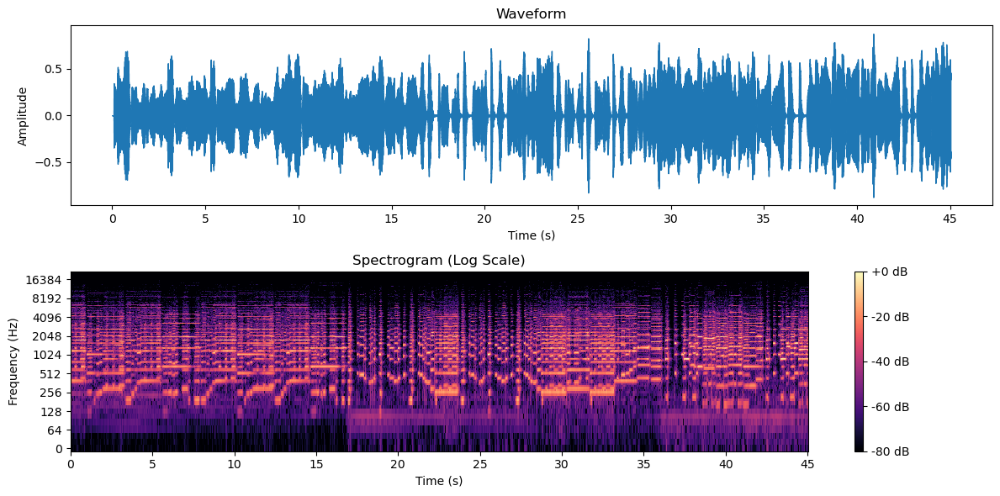

In [11]:
play_audio_with_visuals(static_annotations['audio_path'][120])

In [12]:
# check for missing data
print(static_annotations['arousal_mean'].isnull().values.any(), static_annotations['arousal_std'].isnull().values.any(), static_annotations['valence_mean'].isnull().values.any(), static_annotations['valence_std'].isnull().values.any(), static_annotations['audio_path'].isnull().values.any())

False False False False False


#### B. Segment valence and arousal

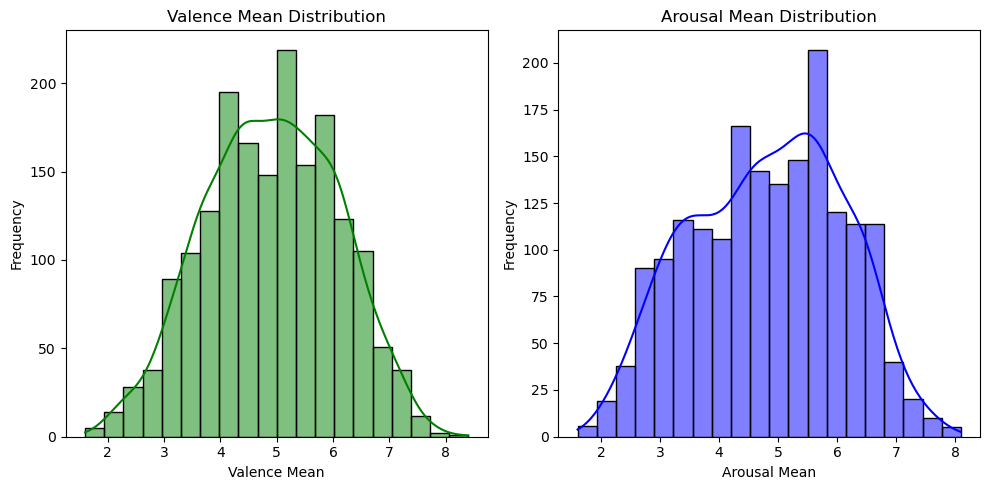

In [13]:
# Check the distribution of valence_mean and arousal_mean
plt.figure(figsize=(10, 5))

# Valence_mean distribution
plt.subplot(1, 2, 1)
sns.histplot(static_annotations['valence_mean'], kde=True, color='green', bins=20)
plt.title('Valence Mean Distribution')
plt.xlabel('Valence Mean')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
sns.histplot(static_annotations['arousal_mean'], kde=True, color='blue', bins=20)
plt.title('Arousal Mean Distribution')
plt.xlabel('Arousal Mean')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

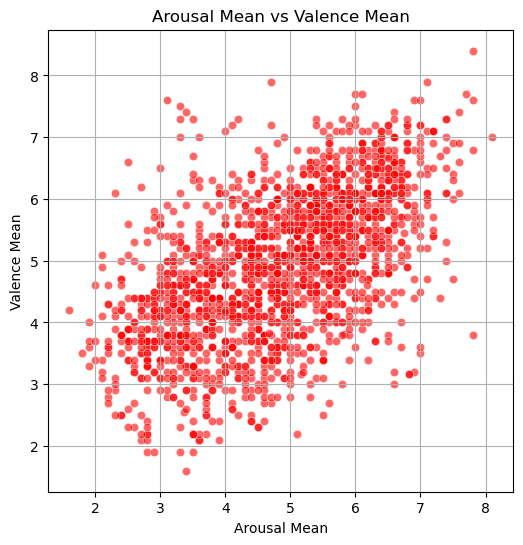

In [14]:
# Scatter plot for arousal_mean vs valence_mean
plt.figure(figsize=(6, 6))
sns.scatterplot(x='arousal_mean', y='valence_mean', data=static_annotations, alpha=0.6, color='red')
plt.title('Arousal Mean vs Valence Mean')
plt.xlabel('Arousal Mean')
plt.ylabel('Valence Mean')
plt.grid(True)
plt.show()

In [15]:
valence_mean_threshold = static_annotations['valence_mean'].mean()
arousal_mean_threshold = static_annotations['arousal_mean'].mean()
print(valence_mean_threshold, arousal_mean_threshold)
arousal_low_threshold = 2
arousal_high_threshold = 7.5
valence_low_threshold = 2
valence_high_threshold = 7.5

4.90414539400666 4.814028856825749


In [16]:
static_annotations['arousal_mean'].max()
static_annotations['valence_mean'].max()

8.4

In [17]:
arousal_low = static_annotations.loc[static_annotations['arousal_mean'] < arousal_low_threshold ]
arousal_high = static_annotations.loc[static_annotations['arousal_mean'] > arousal_high_threshold]
arousal_low.reset_index(drop=True, inplace=True)
arousal_high.reset_index(drop=True, inplace=True)

##### a. Example of low arousal music piece

Playing: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio/MEMD_audio/745.mp3


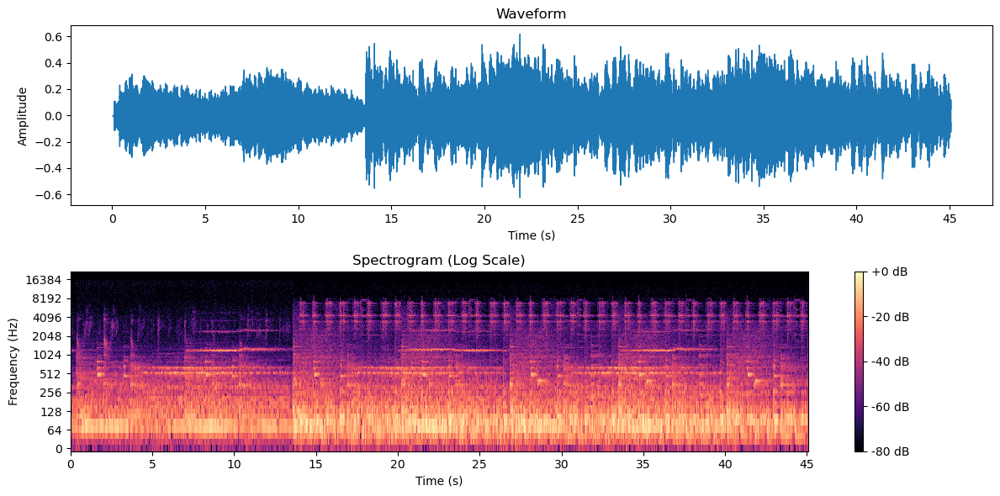

In [18]:
play_audio_with_visuals(arousal_low['audio_path'][0])

##### b. Example of high arousal music piece

Playing: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio/MEMD_audio/960.mp3


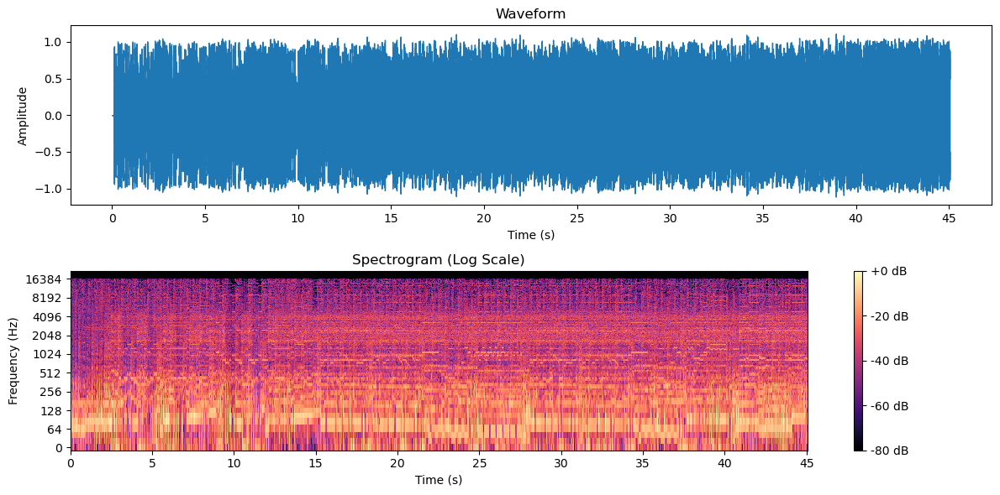

In [19]:
play_audio_with_visuals(arousal_high['audio_path'][6])

##### c. Example of low valence

In [20]:
valence_low = static_annotations.loc[static_annotations['valence_mean'] < valence_low_threshold ]
valence_high = static_annotations.loc[static_annotations['valence_mean'] > 8]
valence_low.reset_index(drop=True, inplace=True)
valence_high.reset_index(drop=True, inplace=True)

Playing: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio/MEMD_audio/198.mp3


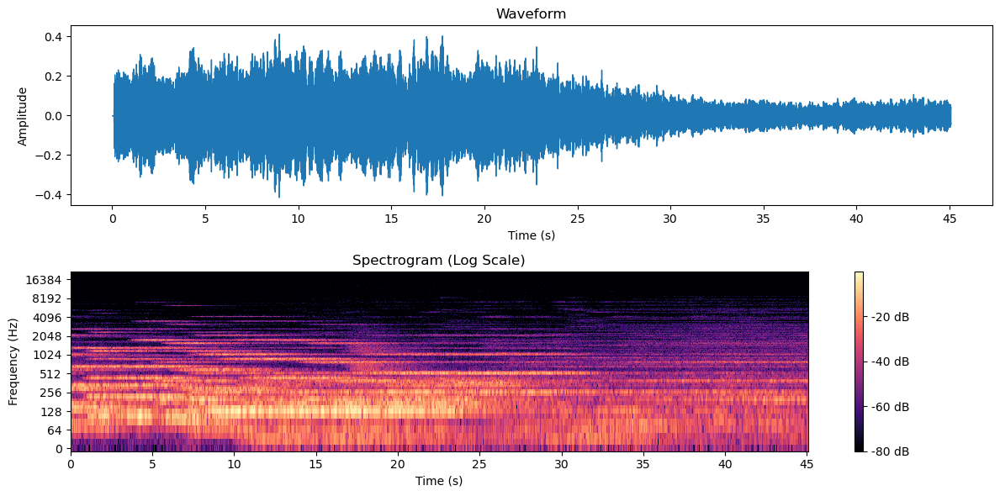

In [21]:
play_audio_with_visuals(valence_low['audio_path'][0])

##### d. Example of high valence music piece

Playing: /Users/vuongnguyen/.cache/kagglehub/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music/versions/1/DEAM_audio/MEMD_audio/115.mp3


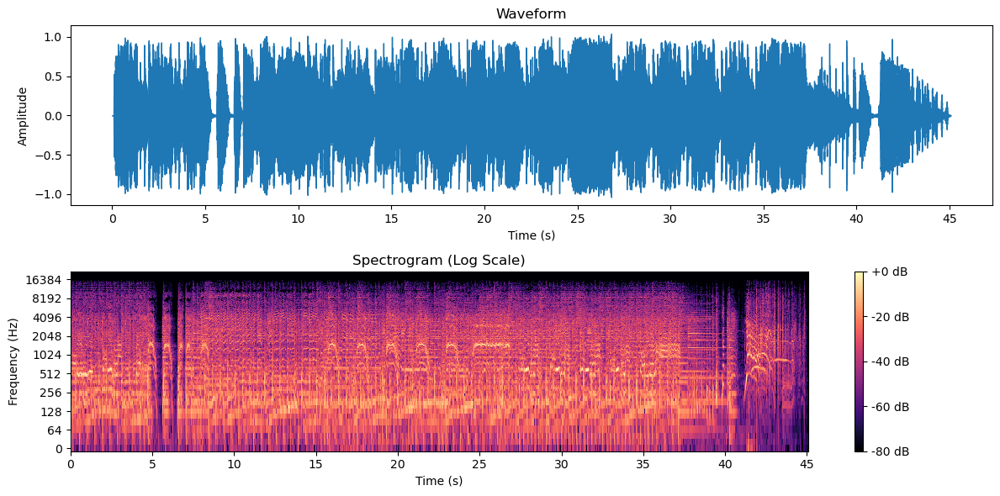

In [22]:
play_audio_with_visuals(valence_high['audio_path'][0])

### C. Extract features for DEAM data

In [23]:
def get_wave_form_data(file_path):
    waveaudio,sr = librosa.load(file_path)
    return waveaudio

# extract mcff
def extract_mfcc(waveform_data):
    return librosa.feature.mfcc(y=waveform_data, sr = 22050, n_mfcc=40, hop_length=512, n_fft=2048)

# extract zero crossing rate
def extract_zero_crossing_rate(wave_data):
    return librosa.feature.zero_crossing_rate(y=wave_data)

In [24]:
static_annotations['waveform'] = static_annotations['audio_path'].apply(lambda x: get_wave_form_data(x))

In [25]:
static_annotations['waveform']

0       [-3.577867e-18, -3.7947076e-19, -7.047314e-19,...
1       [-4.3368087e-18, 1.0842022e-19, -3.2526065e-18...
2       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
                              ...                        
1797    [4.32987e-15, 4.440892e-15, -1.9984014e-15, -5...
1798    [-1.110223e-16, 3.330669e-16, -1.6653345e-16, ...
1799    [8.326673e-17, 2.0816682e-16, -3.8857806e-16, ...
1800    [-3.330669e-16, -1.110223e-16, 2.6367797e-16, ...
1801    [-5.551115e-17, 5.551115e-17, 7.459311e-17, 1....
Name: waveform, Length: 1802, dtype: object

In [26]:
# static_annotations['waveform'] = [waveform_data[i][0] for i in range(len(waveform_data))]
# static_annotations['sample_rate'] = [waveform_data[i][1] for i in range(len(waveform_data))]

In [27]:
static_annotations['mfcc'] = static_annotations['waveform'].apply(lambda x: extract_mfcc(x))
static_annotations['zero_crossing_rate'] = static_annotations['waveform'].apply(lambda x: extract_zero_crossing_rate(x))

In [28]:
static_annotations.loc[static_annotations['mfcc'].apply(lambda x: len(x)) != 40]

,song_id,valence_mean,valence_std,arousal_mean,arousal_std,audio_path,waveform,mfcc,zero_crossing_rate


In [29]:

def pad_np(mfcc, target_length):
    current_length = mfcc.shape[1]
    if current_length < target_length:
        # Pad with zeros
        pad_width = target_length - current_length
        mfcc = np.pad(mfcc, ((0, 0), (0, pad_width)), mode='constant')
    else:
        # Truncate
        mfcc = mfcc[:, :target_length]
    return mfcc

In [30]:
padded_mfccs = static_annotations['mfcc'].apply(lambda x: pad_np(x, 1940))

In [31]:
static_annotations['truncated_mfcc']=padded_mfccs

In [32]:
# all mfccs have the same dimension
static_annotations.loc[(static_annotations['truncated_mfcc'].apply(lambda x: len(x)) != 40) | (static_annotations['truncated_mfcc'].apply(lambda x: len(x[0])) != 1940)]

,song_id,valence_mean,valence_std,arousal_mean,arousal_std,audio_path,waveform,mfcc,zero_crossing_rate,truncated_mfcc


In [33]:
static_annotations.loc[(static_annotations['zero_crossing_rate'].apply(lambda x: len(x)) != 1) | (static_annotations['zero_crossing_rate'].apply(lambda x: len(x[0])) != 1941)]

,song_id,valence_mean,valence_std,arousal_mean,arousal_std,audio_path,waveform,mfcc,zero_crossing_rate,truncated_mfcc
1,3,3.50,1.75,3.30,1.62,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[-4.3368087e-18, 1.0842022e-19, -3.2526065e-18...","[[-537.45374, -537.45374, -451.1676, -354.5387...","[[0.0185546875, 0.0458984375, 0.05126953125, 0...","[[-537.45374, -537.45374, -451.1676, -354.5387..."
2,4,5.70,1.42,5.50,1.63,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[-524.89655, -524.89655, -332.73526, -149.695...","[[0.0361328125, 0.10888671875, 0.12255859375, ...","[[-524.89655, -524.89655, -332.73526, -149.695..."
3,5,4.40,2.01,5.30,1.85,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[-548.58496, -548.58496, -273.39383, -93.6146...","[[0.0283203125, 0.10400390625, 0.130859375, 0....","[[-548.58496, -548.58496, -273.39383, -93.6146..."
11,19,5.90,1.64,4.30,1.90,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[-504.5258, -504.5258, -256.10837, -92.20649,...","[[0.03125, 0.10400390625, 0.12451171875, 0.141...","[[-504.5258, -504.5258, -256.10837, -92.20649,..."
12,20,5.40,2.50,6.50,2.11,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[-581.0369, -518.8391, -299.13492, -155.56012...","[[0.03173828125, 0.07666015625, 0.091796875, 0...","[[-581.0369, -518.8391, -299.13492, -155.56012..."
...,...,...,...,...,...,...,...,...,...,...
1797,2054,5.40,1.20,3.60,1.36,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[4.32987e-15, 4.440892e-15, -1.9984014e-15, -5...","[[-541.06775, -541.06775, -492.2609, -424.5811...","[[0.06689453125, 0.09326171875, 0.09716796875,...","[[-541.06775, -541.06775, -492.2609, -424.5811..."
1798,2055,5.00,1.41,5.20,1.47,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[-1.110223e-16, 3.330669e-16, -1.6653345e-16, ...","[[-494.20117, -494.20117, -413.42294, -244.359...","[[0.12353515625, 0.25341796875, 0.28759765625,...","[[-494.20117, -494.20117, -413.42294, -244.359..."
1799,2056,5.00,1.41,4.60,1.74,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[8.326673e-17, 2.0816682e-16, -3.8857806e-16, ...","[[-568.5693, -567.0969, -446.18774, -352.07526...","[[0.0478515625, 0.095703125, 0.10791015625, 0....","[[-568.5693, -567.0969, -446.18774, -352.07526..."
1800,2057,3.17,1.07,6.83,0.37,/Users/vuongnguyen/.cache/kagglehub/datasets/i...,"[-3.330669e-16, -1.110223e-16, 2.6367797e-16, ...","[[-534.9213, -534.9213, -336.37796, -157.68118...","[[0.05615234375, 0.12255859375, 0.16015625, 0....","[[-534.9213, -534.9213, -336.37796, -157.68118..."


In [34]:
truncated_crossing_rates = static_annotations['zero_crossing_rate'].apply(lambda x: pad_np(x, 1940))

In [35]:
static_annotations['truncated_zero_crossing_rate'] = truncated_crossing_rates

In [36]:
# check if all zero crossing rates have the same dimensions
static_annotations.loc[(static_annotations['truncated_zero_crossing_rate'].apply(lambda x: len(x)) != 1) | (static_annotations['truncated_zero_crossing_rate'].apply(lambda x: len(x[0])) != 1940)]

,song_id,valence_mean,valence_std,arousal_mean,arousal_std,audio_path,waveform,mfcc,zero_crossing_rate,truncated_mfcc,truncated_zero_crossing_rate


### D. Test-train data split

In [37]:
from sklearn.model_selection import train_test_split
# Splitting dataset
features = static_annotations.loc[:,['truncated_mfcc','truncated_zero_crossing_rate']].copy()
X_train, X_test, y_train, y_test = train_test_split(features, static_annotations, test_size=0.2, random_state=42)

In [38]:
import tensorflow as tf
def transform_input(series, dx, dy):
    # input is a Pandas Series
    input = series.apply(lambda x: x.reshape(1,dx,dy,1))
    input_stacked = np.stack(input.values)
    
    # convert to tensor
    result = tf.convert_to_tensor(input_stacked, dtype=tf.float32)
    return input_stacked



In [39]:
# conver Series into numpy array first before 
mfcc_tensor = transform_input(X_train['truncated_mfcc'], 40, 1940)
zcr_tensor = transform_input(X_train['truncated_zero_crossing_rate'], 1, 1940)

In [40]:
labels = y_train.loc[:,['valence_mean']].copy()
labels = np.array(labels)

In [41]:
dataset = tf.data.Dataset.from_tensor_slices(({'mfcc': mfcc_tensor ,'zcr': zcr_tensor}, labels))
# dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

In [42]:
features['truncated_mfcc'].shape

(1802,)

#### Build CNN architecture

In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import concatenate
from tensorflow.keras.metrics import RootMeanSquaredError
# def create_cnn(width, height, depth, filters=(16,32,64), regress=False):
    # inputShape = (height, width, depth)
    # chanDim = -1
    
    # # define model input
    # inputs = Input(shape=inputShape)

In [44]:
inputA = Input(shape=(40,1940,1), name='mfcc')
inputB = Input(shape=(1,1940,1), name='zcr')

# first branch for valence values
x1 = Conv2D(32,(3,3), activation='relu')(inputA)
x1 = MaxPooling2D((2,2))(x1)
x1 = Dropout(0.25)(x1)

x1 = Conv2D(64,(3,3), activation='relu')(x1)
x1 = MaxPooling2D((2,2))(x1)
x1 = Dropout(0.25)(x1)

x1 = Conv2D(128,(3,3), activation='relu')(x1)
x1 = MaxPooling2D((2,2))(x1)
x1 = Dropout(0.3)(x1)

x1 = Flatten()(x1)

In [45]:
x2 = Conv2D(32,(1,3), activation='relu')(inputB)
x2 = MaxPooling2D((1,2))(x2)
x2 = Dropout(0.25)(x2)

x2 = Conv2D(64,(1,3), activation='relu')(x2)
x2 = MaxPooling2D((1,2))(x2)
x2 = Dropout(0.25)(x2)

x2 = Conv2D(128,(1,3), activation='relu')(x2)
x2 = MaxPooling2D((1,2))(x2)
x2 = Dropout(0.3)(x2)


x2 = Flatten()(x2)

In [46]:
combined = concatenate([x1,x2])
z=Dense(128, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.4)(z)

z=Dense(64, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.4)(z)

z=Dense(32, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z=Dense(8, activation='relu')(combined)
# z=Dense(4, activation='relu')(combined)
output = Dense(1,activation='linear')(z)
model=Model(inputs=[inputA, inputB], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=[RootMeanSquaredError()])

In [47]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ mfcc (InputLayer)   │ (None, 40, 1940,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zcr (InputLayer)    │ (None, 1, 1940,   │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 38, 1938,  │        320 │ mfcc[0][0]        │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 1, 1938,   │        128 │ zcr[0][0]         │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 19, 969,   │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 1, 969,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 19, 969,   │          0 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 1, 969,    │          0 │ max_pooling2d_3[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 17, 967,   │     18,496 │ dropout[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 1, 967,    │      6,208 │ dropout_3[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 8, 483,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 1, 483,    │          0 │ conv2d_4[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 8, 483,    │          0 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 1, 483,    │          0 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 6, 481,    │     73,856 │ dropout_1[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 1, 481,    │     24,704 │ dropout_4[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 240,    │          0 │ conv2d_2[0][0]  

 Total params: 1,106,769 (4.22 MB)

 Trainable params: 1,106,769 (4.22 MB)

 Non-trainable params: 0 (0.00 B)

In [48]:
model.fit(
    dataset,
    epochs=10,
    steps_per_epoch=len(mfcc_tensor) // 32
)

Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 2453.0737 - root_mean_squared_error: 46.1277
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 3.8149 - root_mean_squared_error: 1.9356
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 3.9628 - root_mean_squared_error: 1.9823
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 3.1218 - root_mean_squared_error: 1.7271
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 1.2904 - root_mean_squared_error: 1.1073
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 1.5253 - root_mean_squared_error: 1.2288
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 2.2353 - root_mean_squared_error: 1.4778
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 1.2698 - root_mean_squared_error: 1.1092
Epoch 9/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 1.5506 - root_mean_squared_error: 1.2437
Epoch 10/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 1.2980 - root_mean_squared_error: 1.

In [49]:
mfcc_test = transform_input(X_test['truncated_mfcc'], 40, 1940)
zcr_test = transform_input(X_test['truncated_zero_crossing_rate'], 1, 1940)
y_test = y_test.loc[:,['valence_mean']].copy()
y_test = np.array(y_test)

In [50]:
test_data = tf.data.Dataset.from_tensor_slices(({'mfcc': mfcc_test ,'zcr': zcr_test}, y_test))

In [51]:
test_metrics = model.evaluate(test_data)
print(f'Test Loss: {test_metrics[0]}')
print(f'Test RMSE: {test_metrics[1]}')
# print(f'Test RMSE: {test_metrics[2]}')

361/361 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.8529 - root_mean_squared_error: 1.3543
Test Loss: 1.7449097633361816
Test RMSE: 1.3209502696990967


In [52]:
model.metrics_names

['loss', 'compile_metrics']

### E. Train CNN model for predicting arousal

In [63]:
arousal_train = y_train.loc[:,['arousal_mean']].copy()
arousal_train = np.array(arousal_train)

In [64]:
dataset = tf.data.Dataset.from_tensor_slices(({'mfcc': mfcc_tensor ,'zcr': zcr_tensor}, arousal_train))

In [65]:
inputA = Input(shape=(40,1940,1), name='mfcc')
inputB = Input(shape=(1,1940,1), name='zcr')

# first branch for valence values
x1_arousal = Conv2D(32,(3,3), activation='relu')(inputA)
x1_arousal = MaxPooling2D((2,2))(x1_arousal)
x1_arousal = Dropout(0.25)(x1_arousal)

x1_arousal = Conv2D(64,(3,3), activation='relu')(x1_arousal)
x1_arousal = MaxPooling2D((2,2))(x1_arousal)
x1_arousal = Dropout(0.25)(x1_arousal)

x1_arousal = Conv2D(128,(3,3), activation='relu')(x1_arousal)
x1_arousal = MaxPooling2D((2,2))(x1_arousal)
x1_arousal = Dropout(0.3)(x1_arousal)

x1_arousal = Flatten()(x1_arousal)

In [66]:
x2_arousal = Conv2D(32,(1,3), activation='relu')(inputB)
x2_arousal = MaxPooling2D((1,2))(x2_arousal)
x2_arousal = Dropout(0.25)(x2_arousal)

x2_arousal = Conv2D(64,(1,3), activation='relu')(x2_arousal)
xx2_arousal2 = MaxPooling2D((1,2))(x2_arousal)
x2_arousal = Dropout(0.25)(x2_arousal)

x2_arousal = Conv2D(128,(1,3), activation='relu')(x2_arousal)
x2_arousal = MaxPooling2D((1,2))(x2_arousal)
x2_arousal = Dropout(0.3)(x2_arousal)


x2_arousal = Flatten()(x2_arousal)

In [71]:
combined_arousal = concatenate([x1_arousal,x2_arousal])
z_arousal=Dense(128, activation='relu')(combined_arousal)
z_arousal = BatchNormalization()(z_arousal)
z_arousal = Dropout(0.4)(z_arousal)

# z_arousal=Dense(64, activation='relu')(z_arousal)
# z_arousal = BatchNormalization()(z_arousal)
# z_arousal = Dropout(0.4)(z_arousal)

# z_arousal=Dense(32, activation='relu')(z_arousal)
# z_arousal = BatchNormalization()(z_arousal)
# z_arousal = Dropout(0.3)(z_arousal)

z_arousal=Dense(8, activation='relu')(combined_arousal)
# z=Dense(4, activation='relu')(combined)
output = Dense(1,activation='linear')(z_arousal)
model=Model(inputs=[inputA, inputB], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=[RootMeanSquaredError()])

In [72]:
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ mfcc (InputLayer)   │ (None, 40, 1940,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 38, 1938,  │        320 │ mfcc[0][0]        │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zcr (InputLayer)    │ (None, 1, 1940,   │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 19, 969,   │          0 │ conv2d_6[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 1, 1938,   │        128 │ zcr[0][0]         │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 19, 969,   │          0 │ max_pooling2d_6[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 1, 969,    │          0 │ conv2d_9[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 17, 967,   │     18,496 │ dropout_9[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_12          │ (None, 1, 969,    │          0 │ max_pooling2d_9[… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 8, 483,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 1, 967,    │      6,208 │ dropout_12[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 8, 483,    │          0 │ max_pooling2d_7[… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_13          │ (None, 1, 967,    │          0 │ conv2d_10[0][0]   │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 6, 481,    │     73,856 │ dropout_10[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 1, 965,    │     24,704 │ dropout_13[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 3, 240,    │          0 │ conv2d_8[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 1, 482,    │          0 │ conv2d_11[0][0] 

 Total params: 1,354,577 (5.17 MB)

 Trainable params: 1,354,577 (5.17 MB)

 Non-trainable params: 0 (0.00 B)

In [73]:
model.fit(
    dataset,
    epochs=10,
    steps_per_epoch=len(mfcc_tensor) // 32
)

Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 1093.9351 - root_mean_squared_error: 30.3533
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 2.8164 - root_mean_squared_error: 1.6723
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 4.4574 - root_mean_squared_error: 2.0850
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 3.2610 - root_mean_squared_error: 1.8022
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 4.9604 - root_mean_squared_error: 2.2023
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 2.2832 - root_mean_squared_error: 1.4891
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 3.8066 - root_mean_squared_error: 1.9447
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 2.6579 - root_mean_squared_error: 1.6148
Epoch 9/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 2.5589 - root_mean_squared_error: 1.5646
Epoch 10/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 1.4983 - root_mean_squared_error: 1.

In [74]:
test_metrics = model.evaluate(test_data)
print(f'Test Loss: {test_metrics[0]}')
print(f'Test RMSE: {test_metrics[1]}')

361/361 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.5489 - root_mean_squared_error: 1.2359
Test Loss: 1.4382153749465942
Test RMSE: 1.199256181716919


## Process classical music

In [53]:
# path = kagglehub.dataset_download("imsparsh/musicnet-dataset")

# print("Path to dataset files:", path)

In [54]:
hiphopera_path = "./data/hiphopera/"
testing_audio_path = Path(os.path.join(hiphopera_path, "1.mp3"))

Playing: data/hiphopera/1.mp3


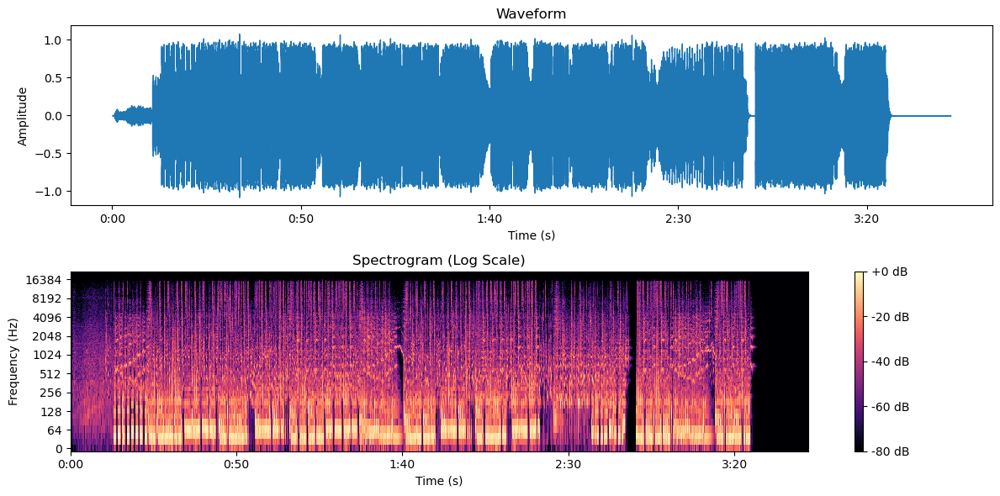

In [55]:
play_audio_with_visuals(testing_audio_path)

In [56]:
hiphopera_wave_data= get_wave_form_data(testing_audio_path)

In [57]:
hiphopera_mfcc = extract_mfcc(hiphopera_wave_data)
hiphopera_zcr=extract_zero_crossing_rate(hiphopera_wave_data)

In [58]:
hiphopera_mfcc.shape

(40, 9570)

In [59]:
hiphopera_zcr.shape

(1, 9570)

In [ ]:
def transform_mfcc_zcr(input_series):
    dx, dy = input_series.shape
    input = input_series.reshape(1,dx,dy,1)
    input_stacked = np.stack(input)
    
    # convert to tensor
    result = tf.convert_to_tensor(input_stacked, dtype=tf.float32)
    return input_stacked

zcr_array = transform_mfcc_zcr(hiphopera_zcr)
mfcc_array = transform_mfcc_zcr(hiphopera_mfcc)

ValueError: cannot reshape array of size 9570 into shape (1,1,1940,1)

In [93]:
# hiphopera_data = dataset = tf.data.Dataset.from_tensor_slices({'mfcc': mfcc_array ,'zcr': zcr_array})
# hiphopera_data.shape

AttributeError: '_TensorSliceDataset' object has no attribute 'shape'

In [85]:
from pydub import AudioSegment
AudioSegment.converter = "C:\\ffmpeg\\ffmpeg\\bin\\ffmpeg.exe"
AudioSegment.ffmpeg = "C:\\ffmpeg\\ffmpeg\\bin\\ffmpeg.exe"
AudioSegment.ffprobe ="C:\\ffmpeg\\ffmpeg\\bin\\ffprobe.exe"

In [86]:
song = AudioSegment.from_mp3(testing_audio_path)

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\ffmpeg\\ffmpeg\\bin\\ffmpeg.exe'